#### Description:
1.Calculate the correlation of the COAD with scReference

2.Normalize the correlation by each features (rows/cell type) into Range1

3.Normalize inside each group of screference cluster (Adult and Fetal), into Range 1 # This is kind of weight of each cell type cluster

4.Do the cluster

#### 1.Data Loading

In [2]:
# CutTree1.Loading_data.R
#### 1.Load dataset
###### read TCGA_COAD data ####
COAD_UCSC_Toil_tpm_dataset <- readRDS("/data8t_4/JH/MyJobs/Read_dataset/UCSC_Toil/COAD_UCSC_Toil_tpm_dataset_merge.syn2623706.rds")
COAD_RSEM_gene_tpm <- COAD_UCSC_Toil_tpm_dataset$COAD.RSEM.gene.tpm
gencode.v23.annotation <- COAD_UCSC_Toil_tpm_dataset$gencode.v23.annotation
COAD.pheno <- COAD_UCSC_Toil_tpm_dataset$COAD.pheno.merge.syn2623706
#head(gencode.v23.annotation)
## convert ensembleID to symbol 
geneMatch <- match(rownames(COAD_RSEM_gene_tpm),gencode.v23.annotation$V1)
geneSymbol <- as.character(gencode.v23.annotation[geneMatch,]$V2)
COAD_tpm_symbol <- COAD_RSEM_gene_tpm
rownames(COAD_tpm_symbol) <- geneSymbol
#head(COAD_tpm_symbol)
## Read log10(x+1) transformed scReference 

#### Load scReference V5 
scReference.log10.CV <- readRDS("/data8t_4/JH/MyJobs/Normal_cell_reference/Step2_Merge_and_Filter_the_scReference/2020_1_29_scReferenceV5.Subset.Features.log10.CV.rds")
scReference.list.log10.CV8000 <- scReference.log10.CV$scReference.list.log10.CV8000
scReference.list.log10.CV4500 <- scReference.log10.CV$scReference.list.log10.CV4500
scReference.list.log10.CV4000 <- scReference.log10.CV$scReference.list.log10.CV4000
scReference.list.log10.CV3500 <- scReference.log10.CV$scReference.list.log10.CV3500
scReference.list.log10.CV3000 <- scReference.log10.CV$scReference.list.log10.CV3000
scReference.list.log10.CV2500 <- scReference.log10.CV$scReference.list.log10.CV2500
scReference.list.log10.CV2000 <- scReference.log10.CV$scReference.list.log10.CV2000
#### 2.Distance calculation
### Distance calculation
##### Distance calculation 
source("/data8t_4/JH/MyJobs/1_R_script/NormalCancer/refCorMerge.R")
### 
##### Transform COAD data
#summary(colSums(COAD_tpm_symbol)) ### So its not log2 transformed
# Expression data transformation Log(x+1)
Log10.expList <- list(COAD_tpm_symbol = log10(COAD_tpm_symbol+1))
Cor.Res.CV8000 <- refCorMerge(Log10.expList, scReference.list.log10.CV8000)
Cor.Res.CV4500 <- refCorMerge(Log10.expList, scReference.list.log10.CV4500)
Cor.Res.CV4000 <- refCorMerge(Log10.expList, scReference.list.log10.CV4000)
Cor.Res.CV3500 <- refCorMerge(Log10.expList, scReference.list.log10.CV3500)
Cor.Res.CV3000 <- refCorMerge(Log10.expList, scReference.list.log10.CV3000)
Cor.Res.CV2500 <- refCorMerge(Log10.expList, scReference.list.log10.CV2500)
Cor.Res.CV2000 <- refCorMerge(Log10.expList, scReference.list.log10.CV2000)
### Find tumor samples
### only tumor samples
TumorID <- rownames(COAD.pheno[COAD.pheno$sampleTypes == "Tumor",])
COAD.pheno.tumor <- COAD.pheno[TumorID,c("sampleTypes","msi","cimp")]

[1] "Using 10 parallel cores"
[1] "Using 10 parallel cores"
[1] "Using 10 parallel cores"
[1] "Using 10 parallel cores"
[1] "Using 10 parallel cores"
[1] "Using 10 parallel cores"
[1] "Using 10 parallel cores"


#### 2.The first Normalization
normal the correlation across each cell type

In [3]:
#### 3.Normalization Tumor samples
### normalize across the features
Trans.Rang1.cv8000<- base::apply(Cor.Res.CV8000$Cor.merged[,TumorID], 1, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv4500<- base::apply(Cor.Res.CV4500$Cor.merged[,TumorID], 1, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv4000<- base::apply(Cor.Res.CV4000$Cor.merged[,TumorID], 1, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv3500<- base::apply(Cor.Res.CV3500$Cor.merged[,TumorID], 1, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv3000<- base::apply(Cor.Res.CV3000$Cor.merged[,TumorID], 1, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv2500<- base::apply(Cor.Res.CV2500$Cor.merged[,TumorID], 1, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv2000<- base::apply(Cor.Res.CV2000$Cor.merged[,TumorID], 1, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv8000 <- t(Trans.Rang1.cv8000)
Trans.Rang1.cv4500 <- t(Trans.Rang1.cv4500)
Trans.Rang1.cv4000 <- t(Trans.Rang1.cv4000)
Trans.Rang1.cv3500 <- t(Trans.Rang1.cv3500)
Trans.Rang1.cv3000 <- t(Trans.Rang1.cv3000)
Trans.Rang1.cv2500 <- t(Trans.Rang1.cv2500)
Trans.Rang1.cv2000 <- t(Trans.Rang1.cv2000)

#### 4.Cluster

##### 2500
#options(repr.plot.width=20, repr.plot.height=15)
#pheatmap::pheatmap(Trans.Rang1.cv2500,annotation_col = COAD.pheno.tumor,
#                   show_colnames = T,cluster_rows = F,scale = "none")

In [ ]:
## Test if i'm right
#summary(Cor.Res.CV2500$Cor.merged[,TumorID])
#summary(t(Cor.Res.CV2500$Cor.merged[,TumorID]))
#summary(t(Trans.Rang1.cv2500))

#### 3.The second Normalization 
Normalize the correlation across each cell type cluster;
It's the weight of each cell type cluster

In [ ]:
rownames(Trans.Rang1.cv2500)

In [7]:
# 1.Subset the Adult and fetal scReference
Trans.Rang1.cv8000_colon_InNormal <- Trans.Rang1.cv8000[c(1:39),]
Trans.Rang1.cv8000_colon_InNormal[1:9,]<- base::apply(Trans.Rang1.cv8000_colon_InNormal[1:9,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv8000_colon_InNormal[10:39,]<- base::apply(Trans.Rang1.cv8000_colon_InNormal[10:39,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
### 4500
Trans.Rang1.cv4500_colon_InNormal <- Trans.Rang1.cv4500[c(1:39),]
Trans.Rang1.cv4500_colon_InNormal[1:9,]<- base::apply(Trans.Rang1.cv4500_colon_InNormal[1:9,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv4500_colon_InNormal[10:39,]<- base::apply(Trans.Rang1.cv4500_colon_InNormal[10:39,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
### 4000
Trans.Rang1.cv4000_colon_InNormal <- Trans.Rang1.cv4000[c(1:39),]
Trans.Rang1.cv4000_colon_InNormal[1:9,]<- base::apply(Trans.Rang1.cv4000_colon_InNormal[1:9,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv4000_colon_InNormal[10:39,]<- base::apply(Trans.Rang1.cv4000_colon_InNormal[10:39,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
### 3500
Trans.Rang1.cv3500_colon_InNormal <- Trans.Rang1.cv3500[c(1:39),]
Trans.Rang1.cv3500_colon_InNormal[1:9,]<- base::apply(Trans.Rang1.cv3500_colon_InNormal[1:9,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv3500_colon_InNormal[10:39,]<- base::apply(Trans.Rang1.cv3500_colon_InNormal[10:39,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
### 3000
Trans.Rang1.cv3000_colon_InNormal <- Trans.Rang1.cv3000[c(1:39),]
Trans.Rang1.cv3000_colon_InNormal[1:9,]<- base::apply(Trans.Rang1.cv3000_colon_InNormal[1:9,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})
Trans.Rang1.cv3000_colon_InNormal[10:39,]<- base::apply(Trans.Rang1.cv3000_colon_InNormal[10:39,], 2, function(x){
  (x-min(x))/(max(x)-min(x))
})

In [ ]:
#### test if I'm right 
#summary(t(Trans.Rang1.cv2500_colon_InNormal[1:9,]))
#summary(t(Trans.Rang1.cv2500_colon_InNormal[10:39,]))

#### 4.Clust and plot

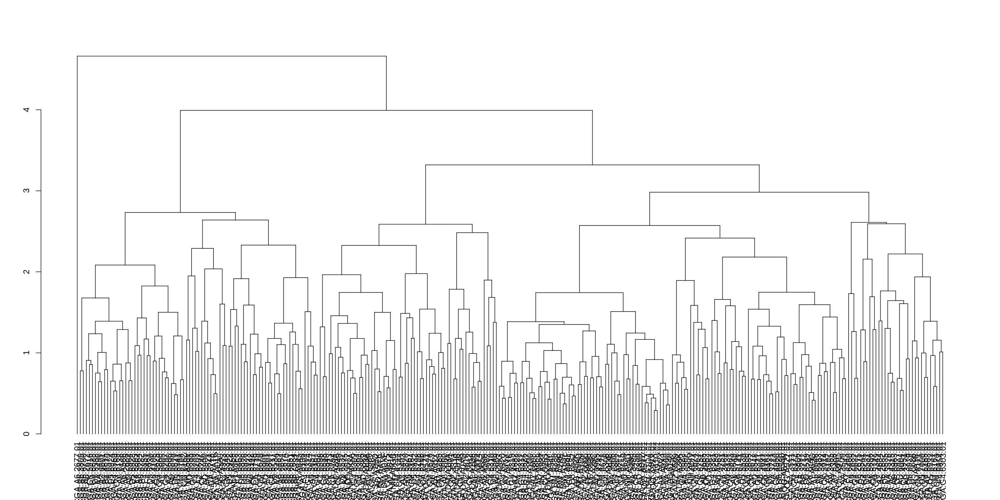

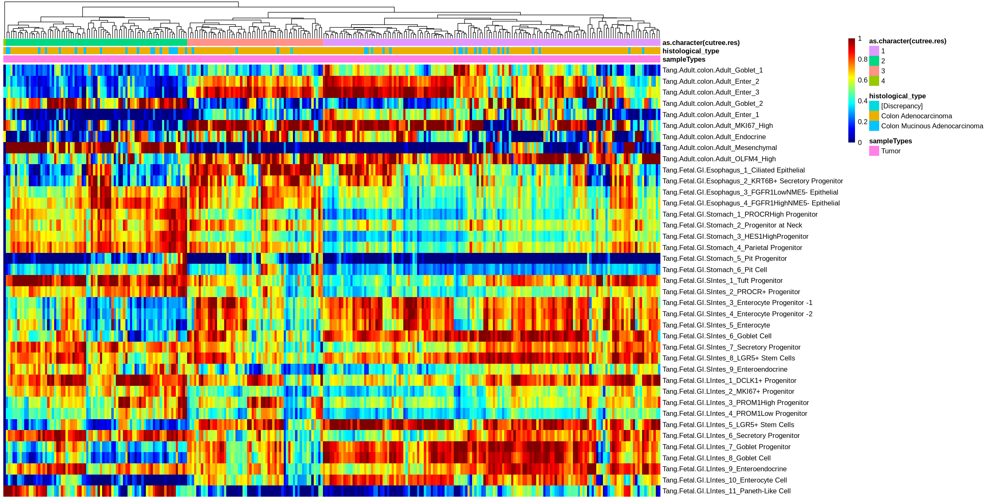

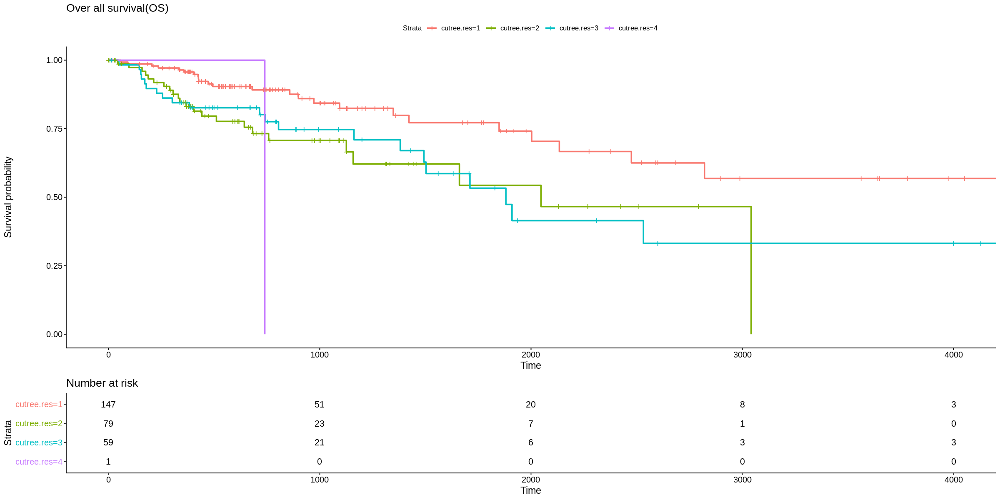

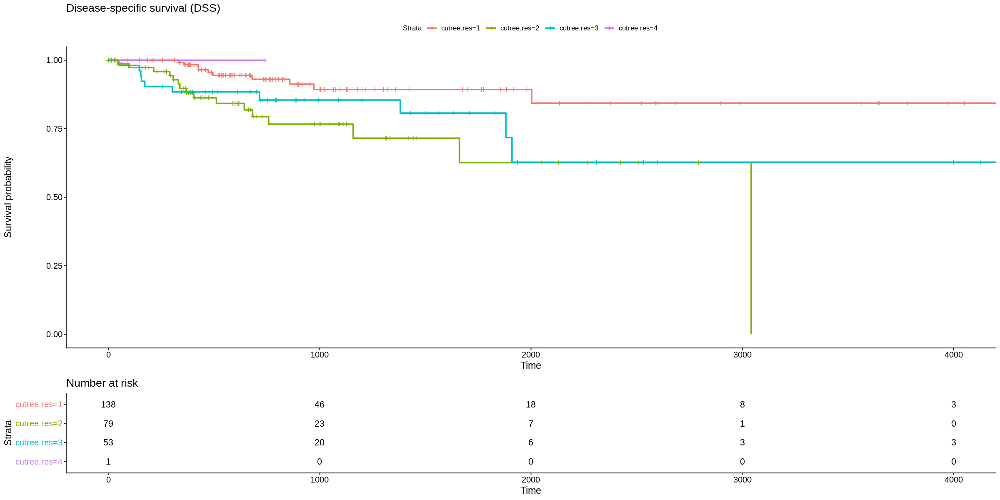

[[1]]

[[2]]

[[3]]

[[4]]

attr(,"class")
[1] "list"            "ggsurvplot_list"

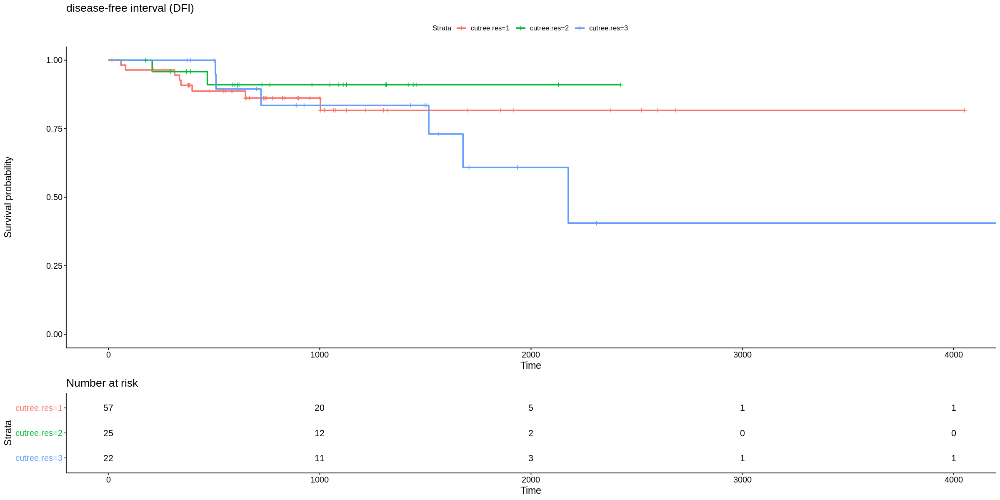

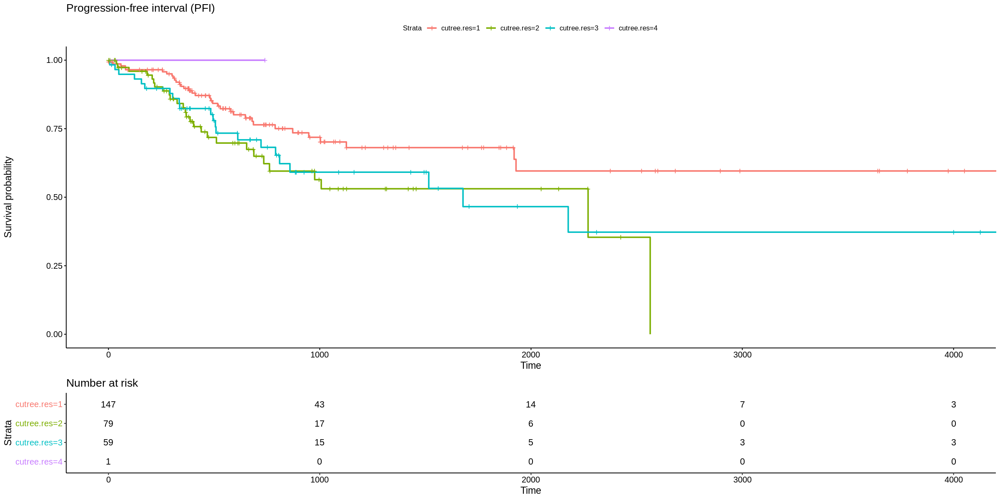

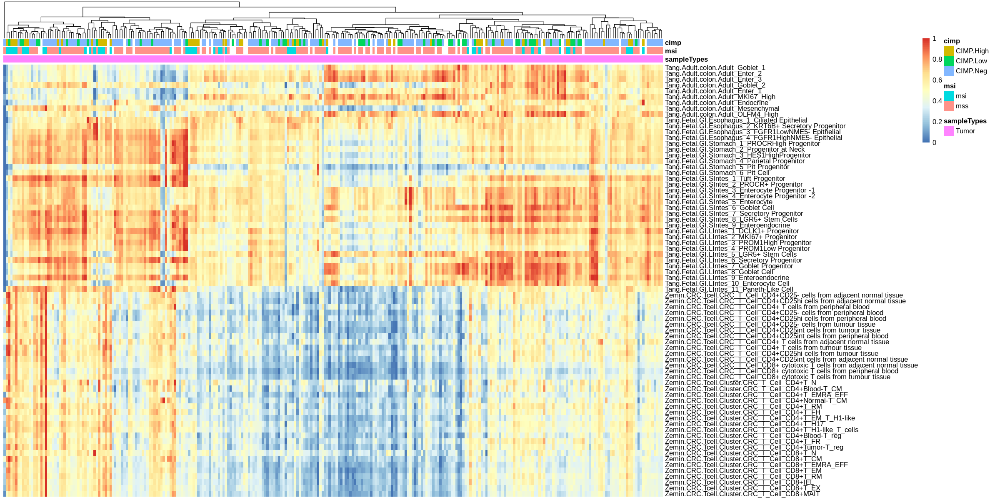

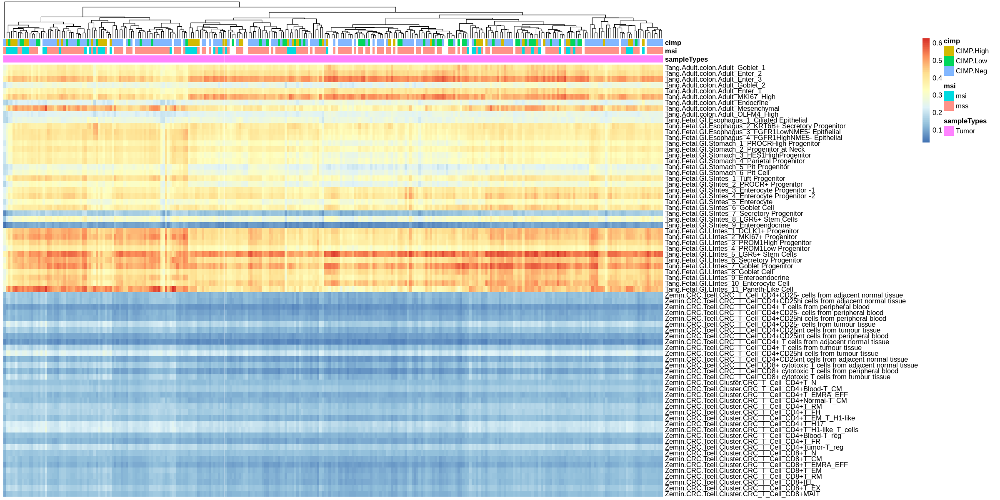

In [8]:
### Step1.Figure out the most appropriate dissimilarity measure 
hclust.Res <- hclust(dist(t(Trans.Rang1.cv8000_colon_InNormal), method="euclidean"), method="complete")
## Not good for dist(): "maximum","canberra","binary"
## Good for dist():"euclidean"="minkowski">"manhattan"
options(repr.plot.width=20, repr.plot.height=10)
source("/data8t_4/JH/MyJobs/1_R_script/TCGA_plot/TCGAClusterSurv.R")
TCGAClusterSurv(Input.tb = Trans.Rang1.cv8000_colon_InNormal, hclust.res = hclust.Res, Col.anno = COAD.pheno[TumorID,], k = 4)

Cluster.Res <- pheatmap::pheatmap(Trans.Rang1.cv8000,annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")
Cluster.Res <- pheatmap::pheatmap(Cor.Res.CV8000$Cor.merged[,TumorID],annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")

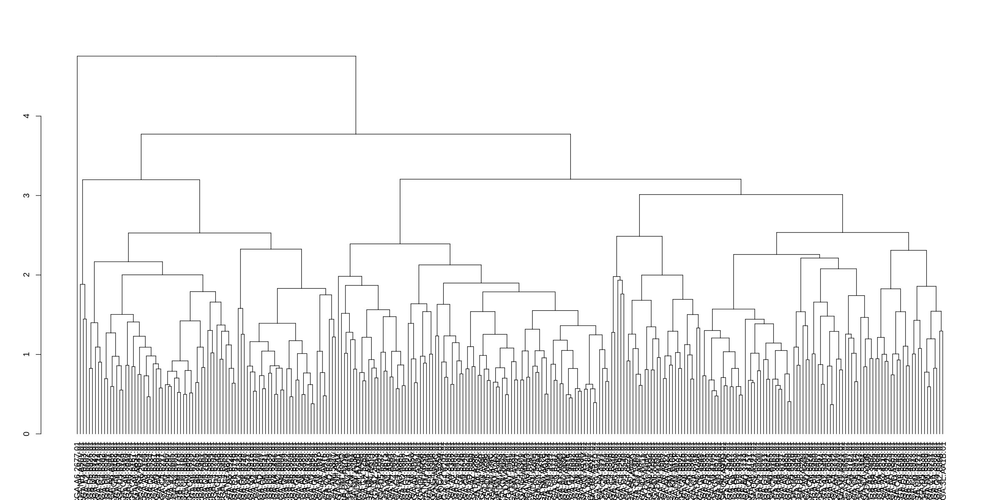

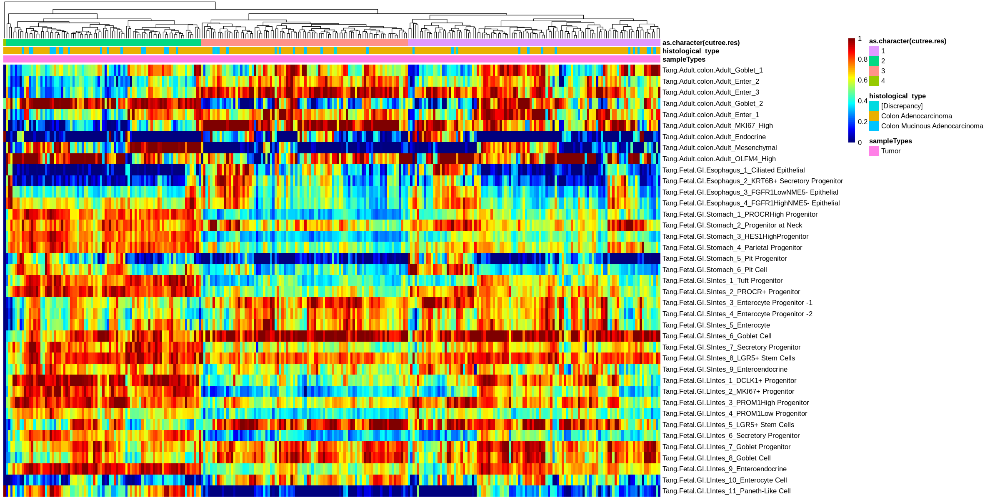

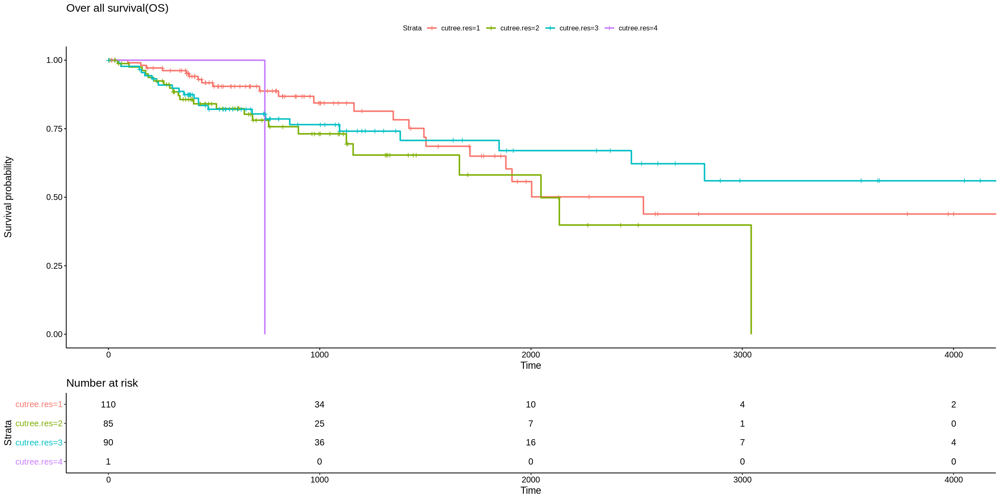

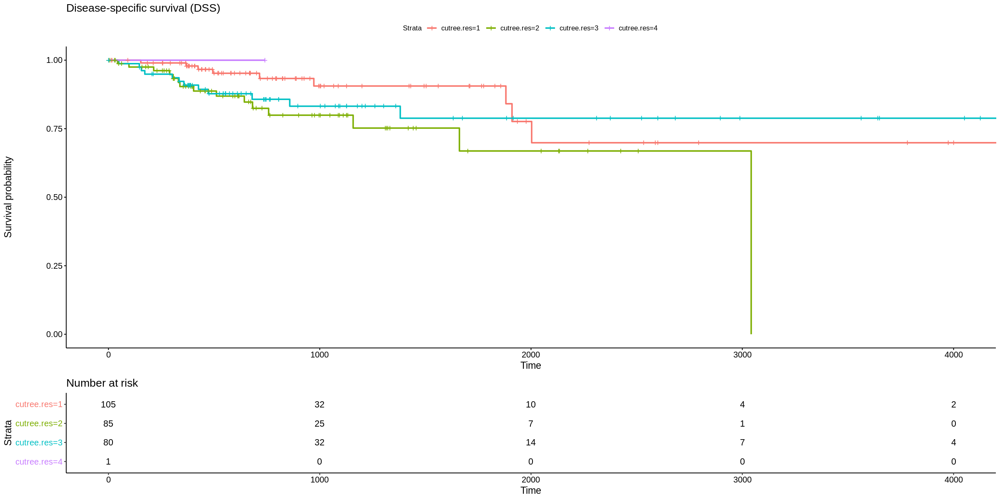

[[1]]

[[2]]

[[3]]

[[4]]

attr(,"class")
[1] "list"            "ggsurvplot_list"

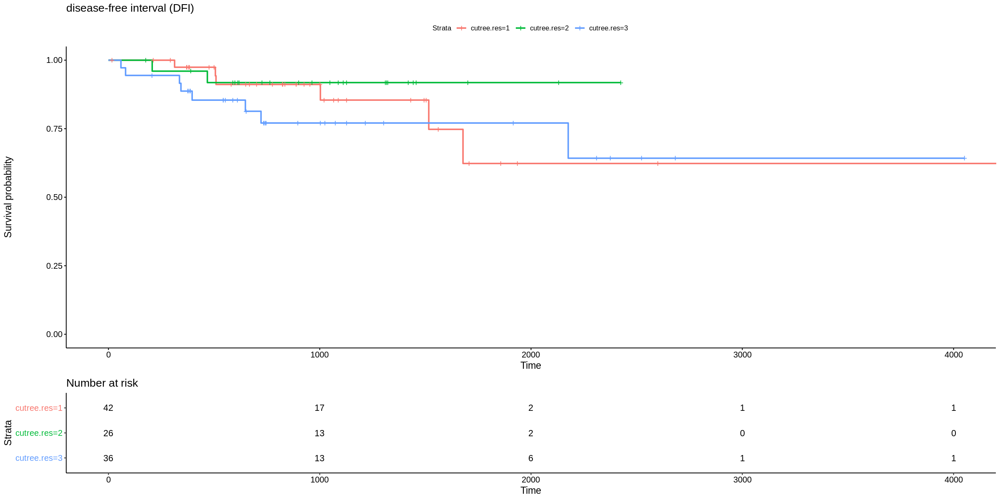

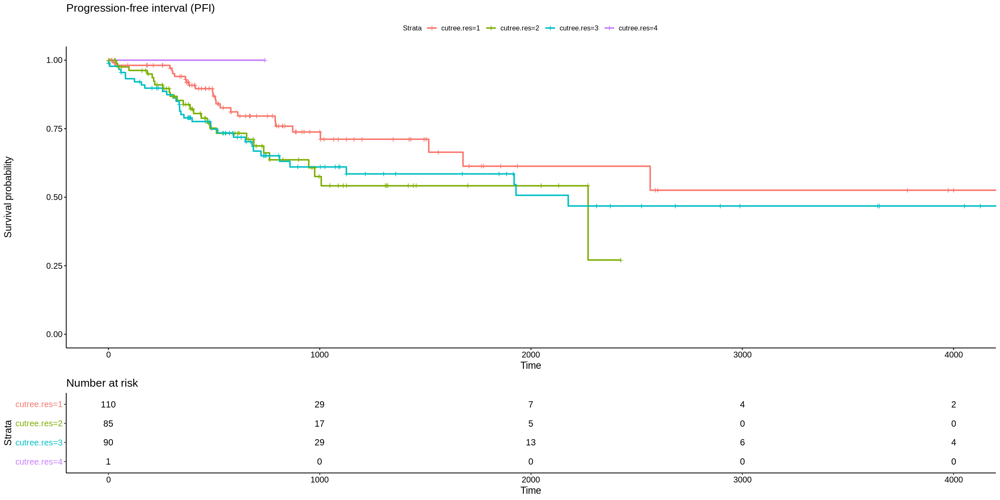

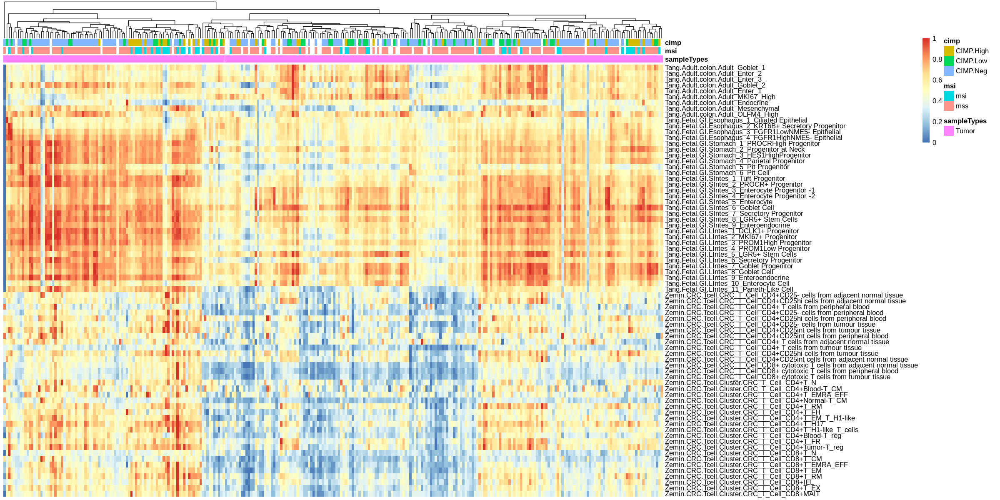

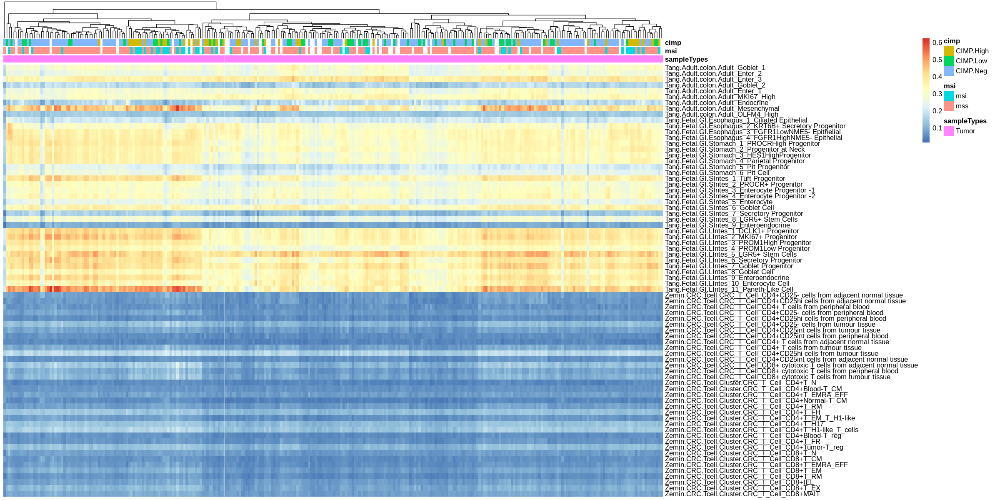

In [9]:
#### 4500
### Step1.Figure out the most appropriate dissimilarity measure 
hclust.Res <- hclust(dist(t(Trans.Rang1.cv4500_colon_InNormal), method="euclidean"), method="complete")
## Not good for dist(): "maximum","canberra","binary"
## Good for dist():"euclidean"="minkowski">"manhattan"
options(repr.plot.width=20, repr.plot.height=10)
source("/data8t_4/JH/MyJobs/1_R_script/TCGA_plot/TCGAClusterSurv.R")
TCGAClusterSurv(Input.tb = Trans.Rang1.cv4500_colon_InNormal, hclust.res = hclust.Res, Col.anno = COAD.pheno[TumorID,], k = 4)

Cluster.Res <- pheatmap::pheatmap(Trans.Rang1.cv4500,annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")
Cluster.Res <- pheatmap::pheatmap(Cor.Res.CV4500$Cor.merged[,TumorID],annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")

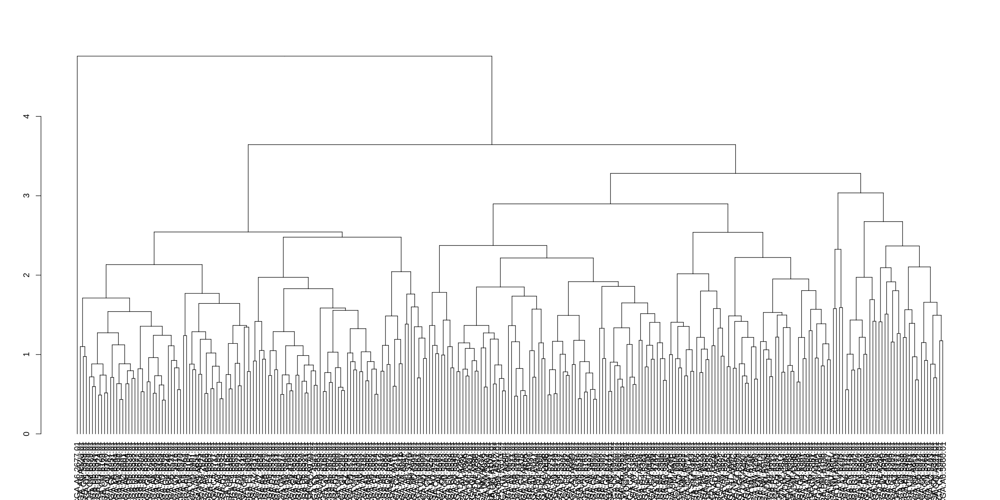

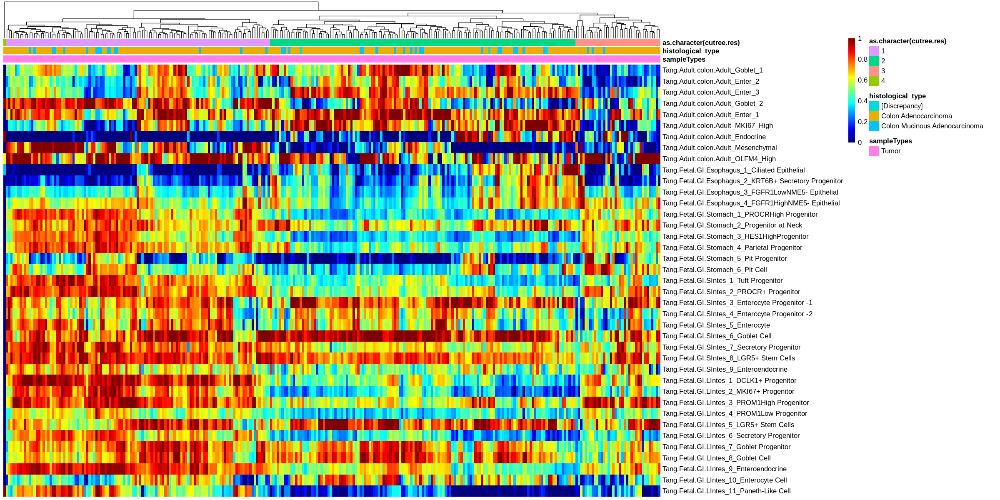

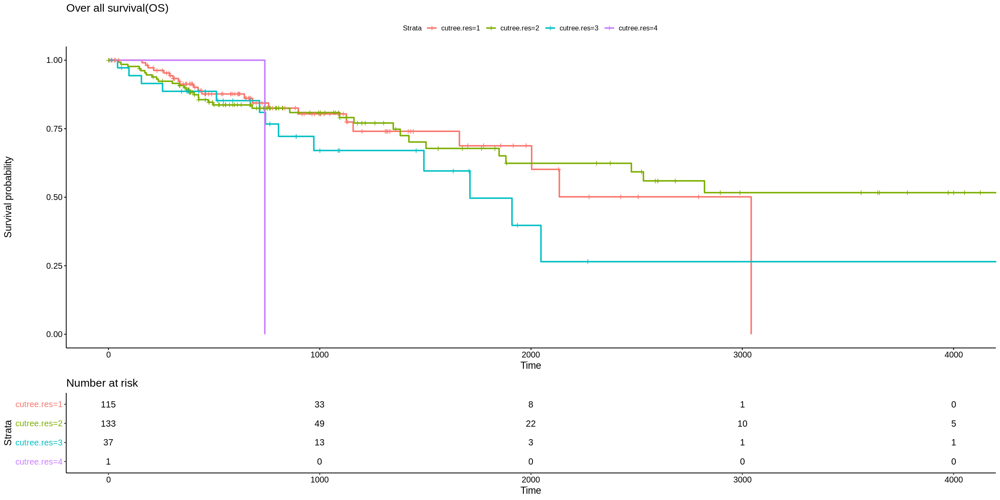

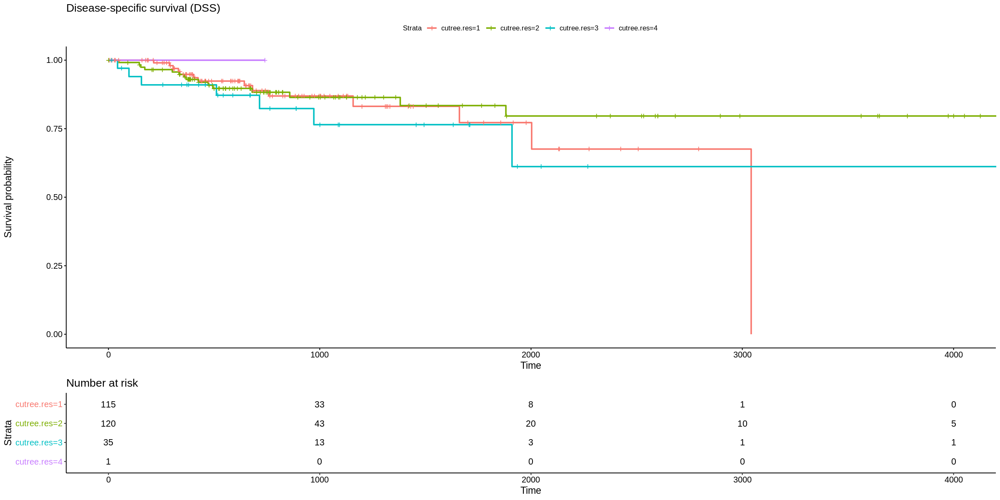

[[1]]

[[2]]

[[3]]

[[4]]

attr(,"class")
[1] "list"            "ggsurvplot_list"

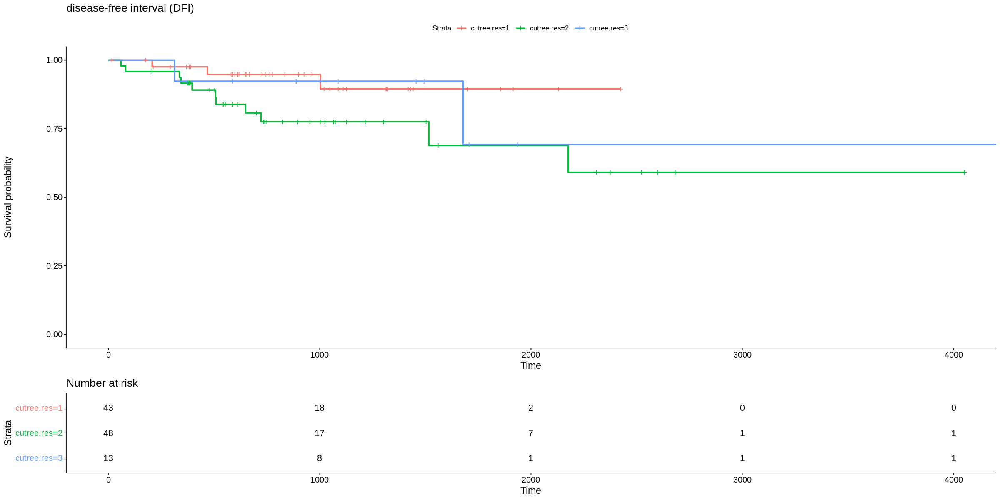

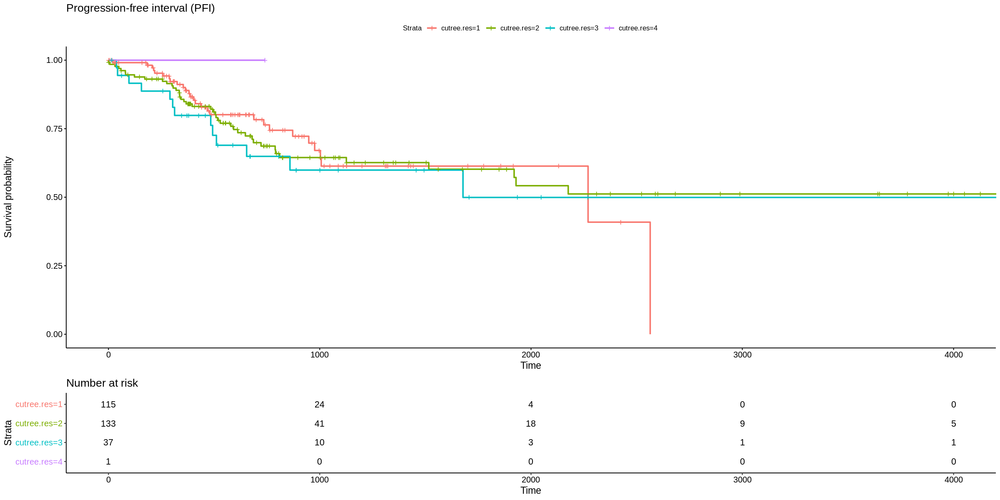

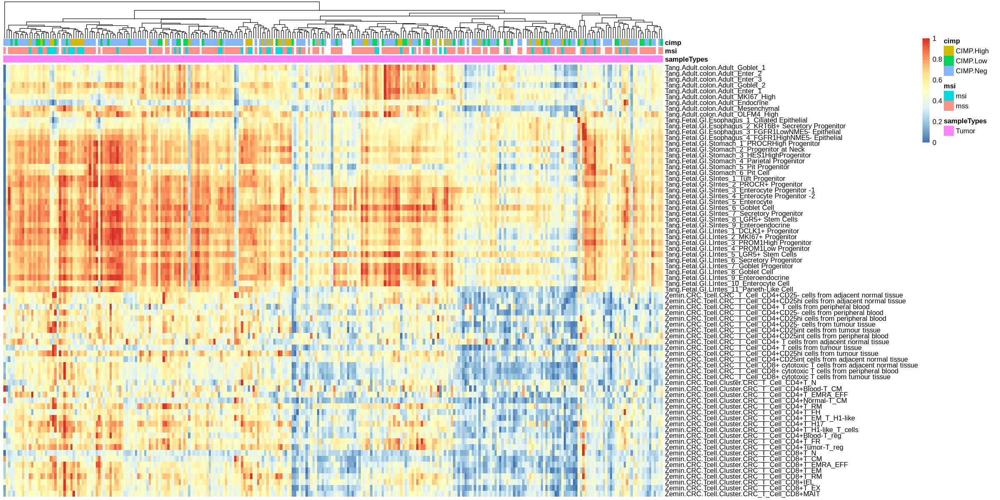

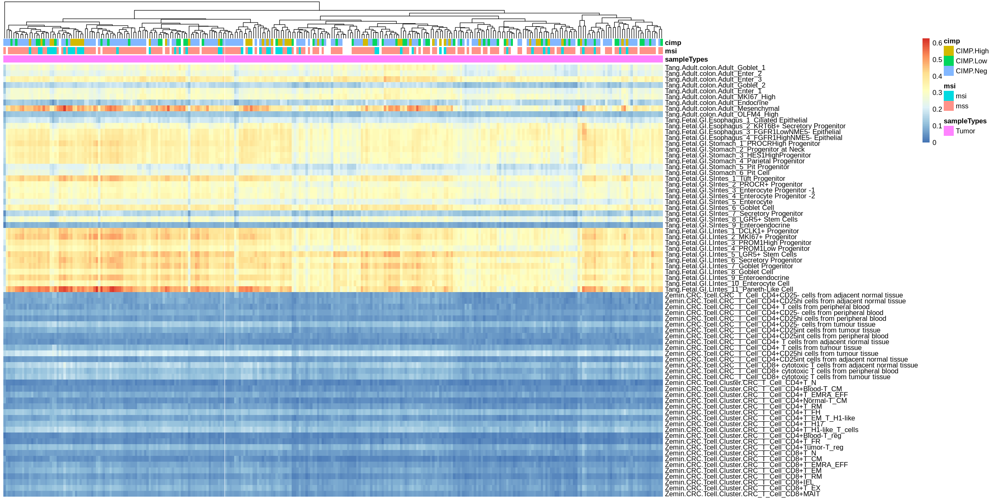

In [10]:
#### 4000
### Step1.Figure out the most appropriate dissimilarity measure 
hclust.Res <- hclust(dist(t(Trans.Rang1.cv4000_colon_InNormal), method="euclidean"), method="complete")
## Not good for dist(): "maximum","canberra","binary"
## Good for dist():"euclidean"="minkowski">"manhattan"
options(repr.plot.width=20, repr.plot.height=10)
source("/data8t_4/JH/MyJobs/1_R_script/TCGA_plot/TCGAClusterSurv.R")
TCGAClusterSurv(Input.tb = Trans.Rang1.cv4000_colon_InNormal, hclust.res = hclust.Res, Col.anno = COAD.pheno[TumorID,], k = 4)

Cluster.Res <- pheatmap::pheatmap(Trans.Rang1.cv4000,annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")
Cluster.Res <- pheatmap::pheatmap(Cor.Res.CV4000$Cor.merged[,TumorID],annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")

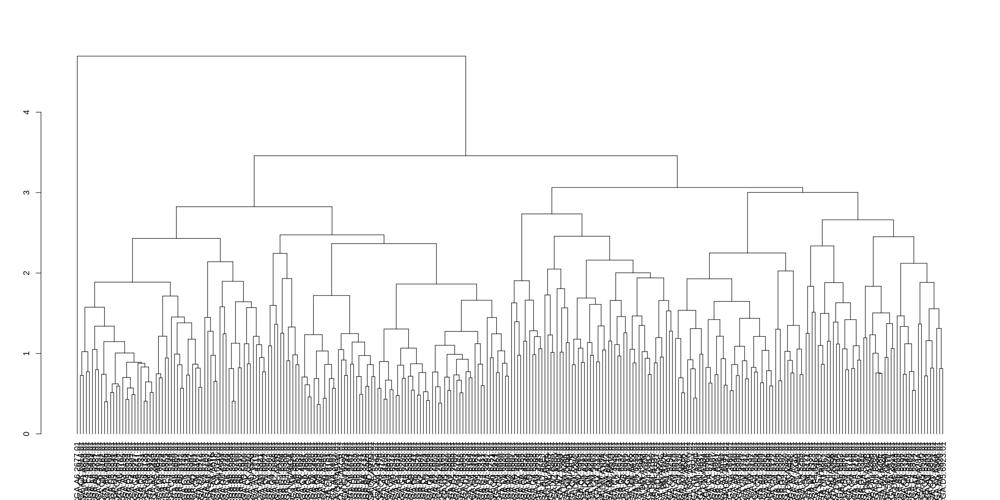

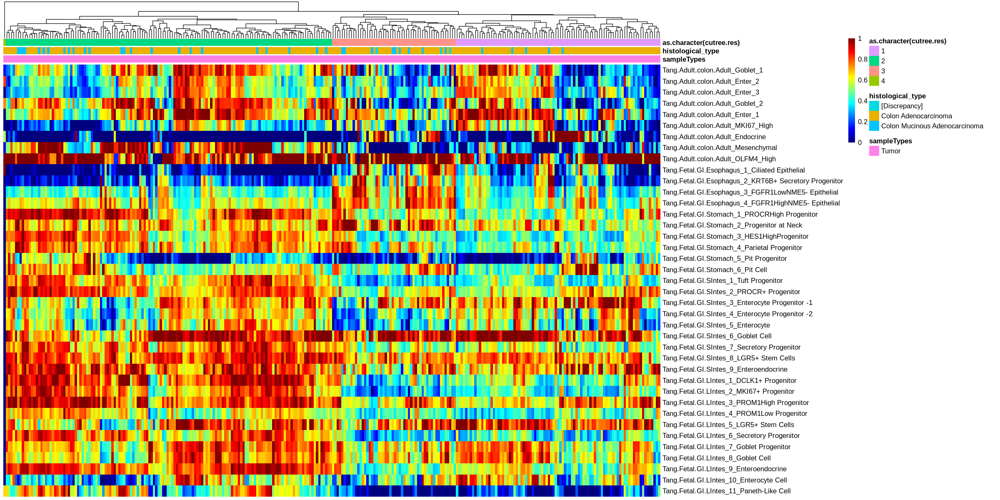

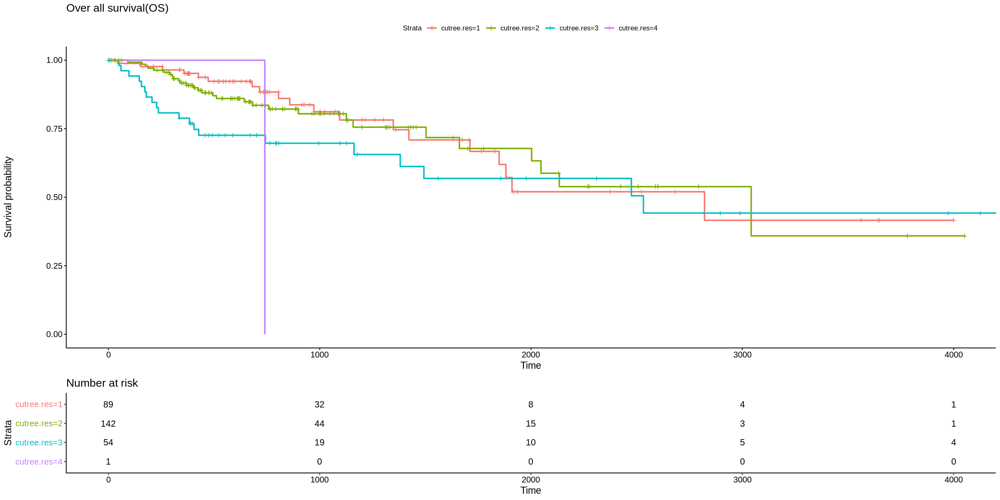

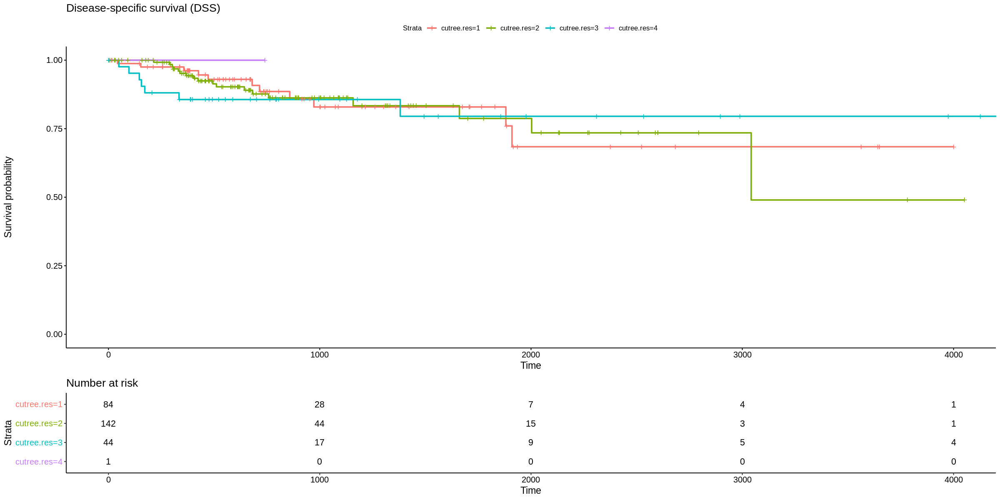

[[1]]

[[2]]

[[3]]

[[4]]

attr(,"class")
[1] "list"            "ggsurvplot_list"

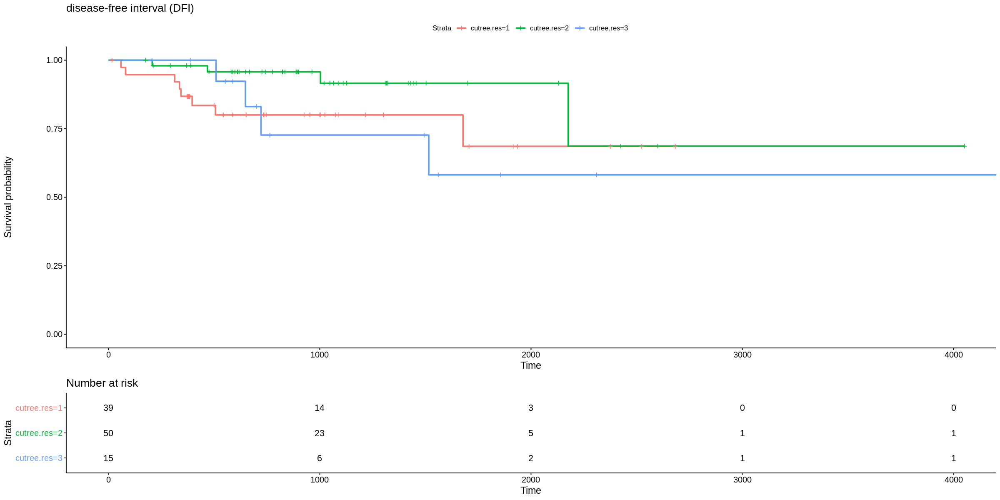

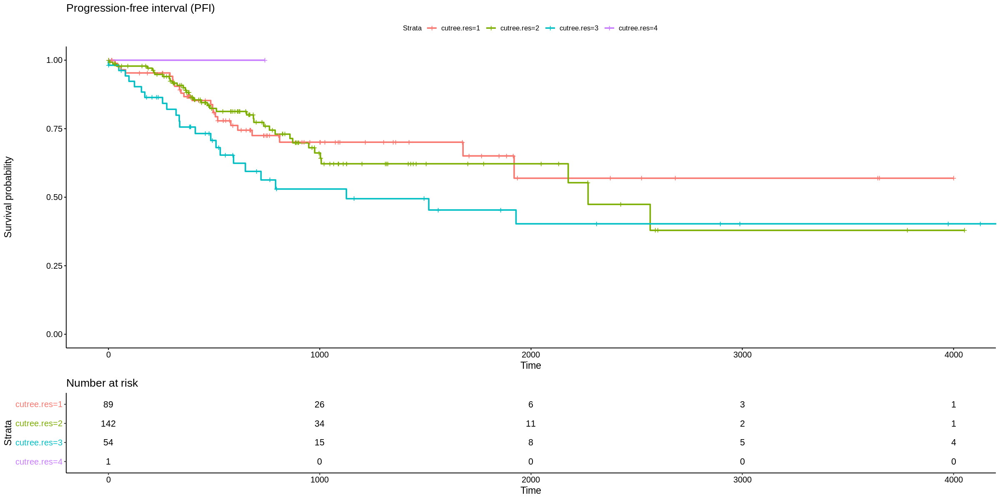

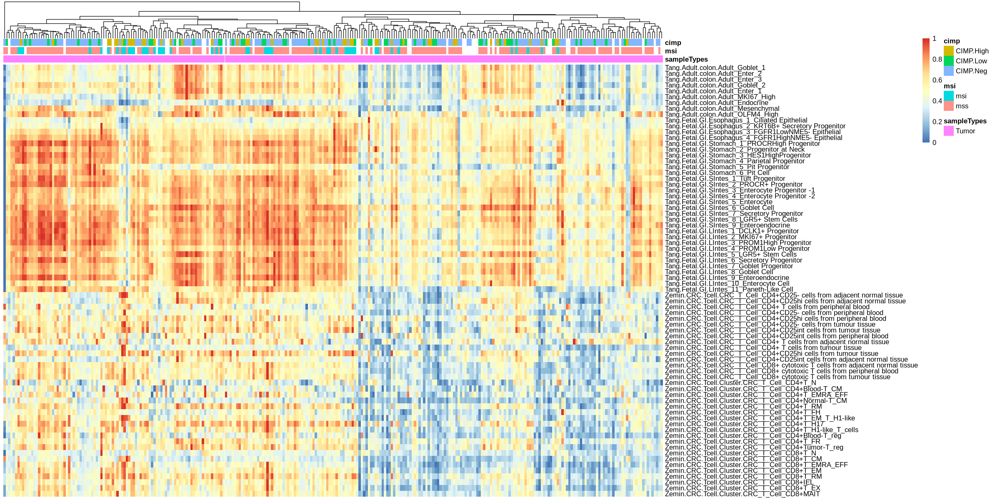

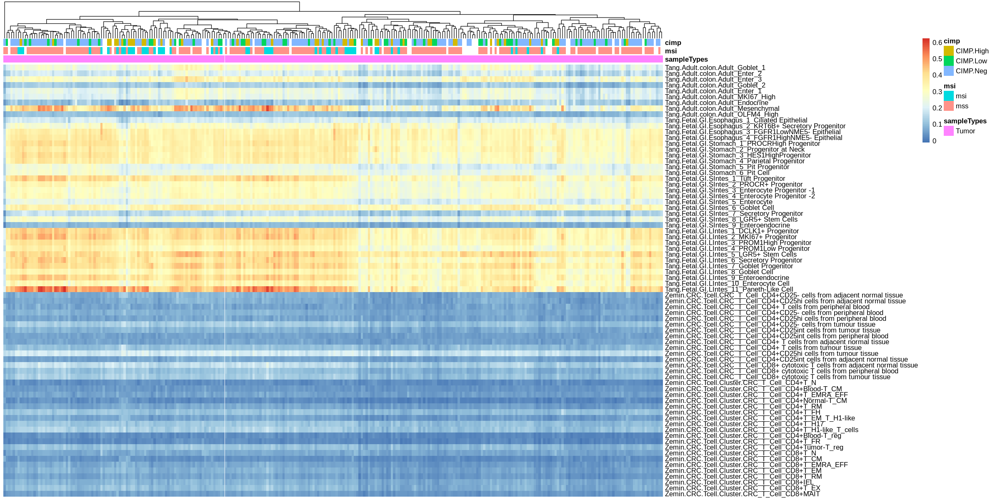

In [11]:
### 3500
### Step1.Figure out the most appropriate dissimilarity measure 
hclust.Res <- hclust(dist(t(Trans.Rang1.cv3500_colon_InNormal), method="euclidean"), method="complete")

## Not good for dist(): "maximum","canberra","binary"
## Good for dist():"euclidean"="minkowski">"manhattan"
options(repr.plot.width=20, repr.plot.height=10)
source("/data8t_4/JH/MyJobs/1_R_script/TCGA_plot/TCGAClusterSurv.R")
TCGAClusterSurv(Input.tb = Trans.Rang1.cv3500_colon_InNormal, hclust.res = hclust.Res, Col.anno = COAD.pheno[TumorID,], k = 4)

Cluster.Res <- pheatmap::pheatmap(Trans.Rang1.cv3500,annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")
Cluster.Res <- pheatmap::pheatmap(Cor.Res.CV3500$Cor.merged[,TumorID],annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")

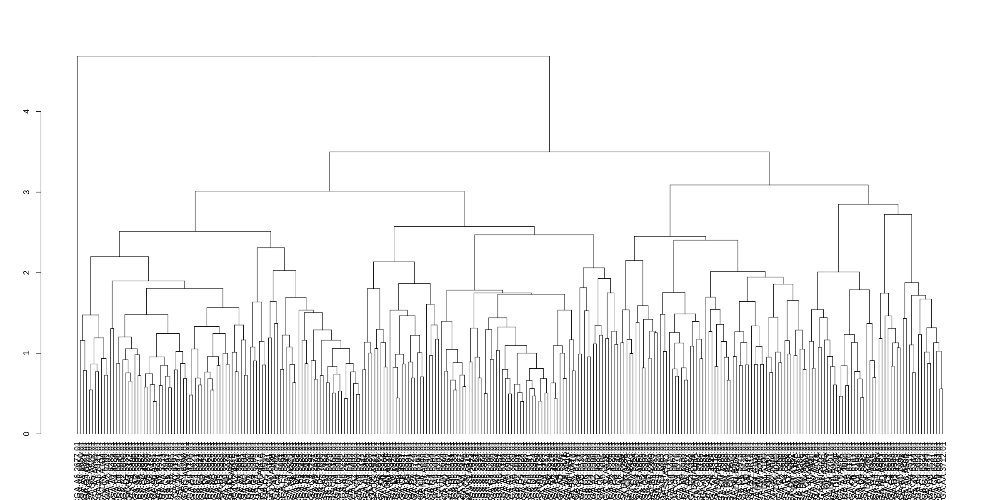

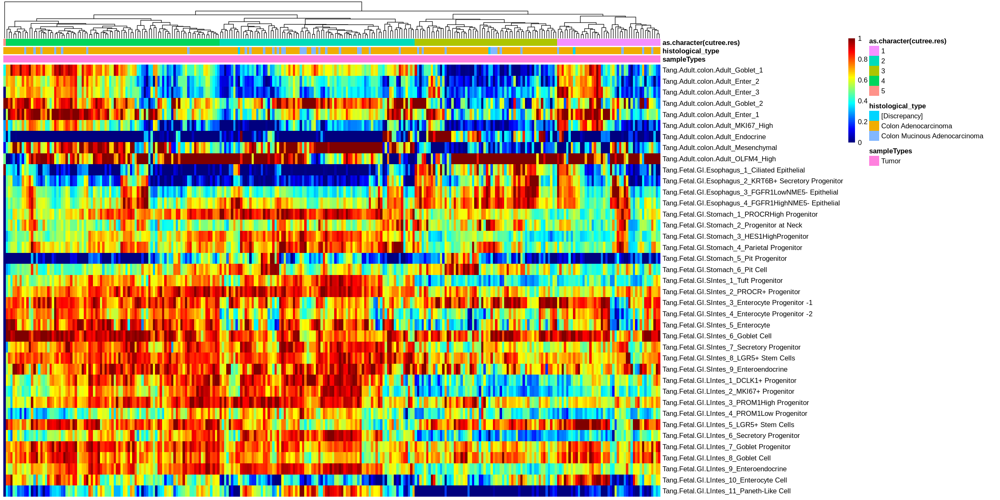

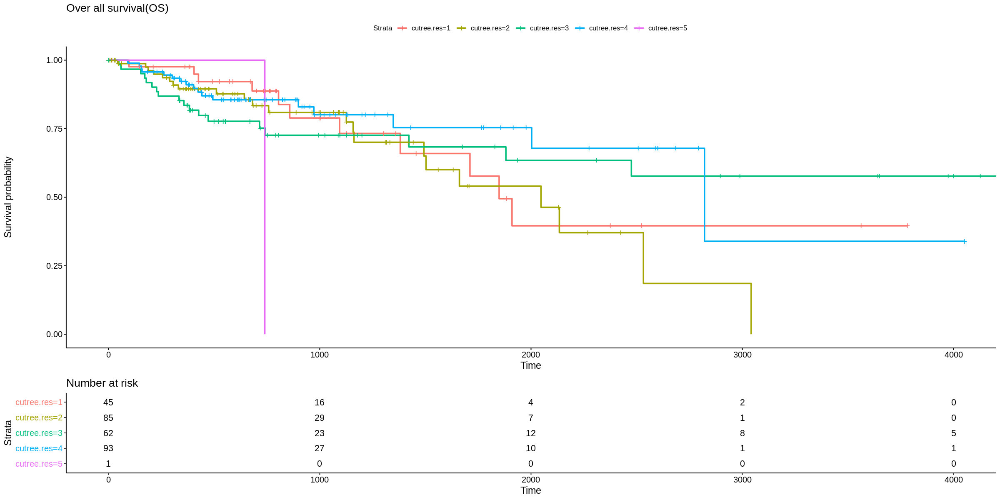

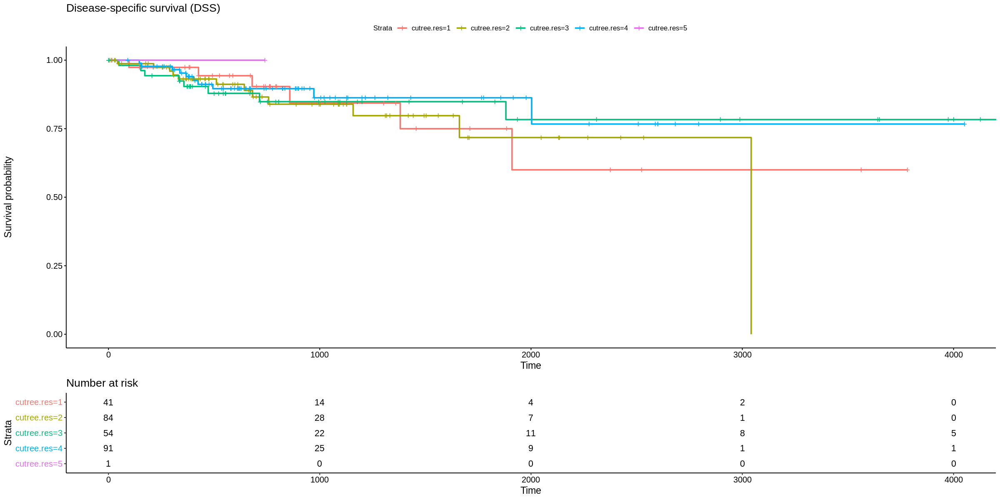

[[1]]

[[2]]

[[3]]

[[4]]

attr(,"class")
[1] "list"            "ggsurvplot_list"

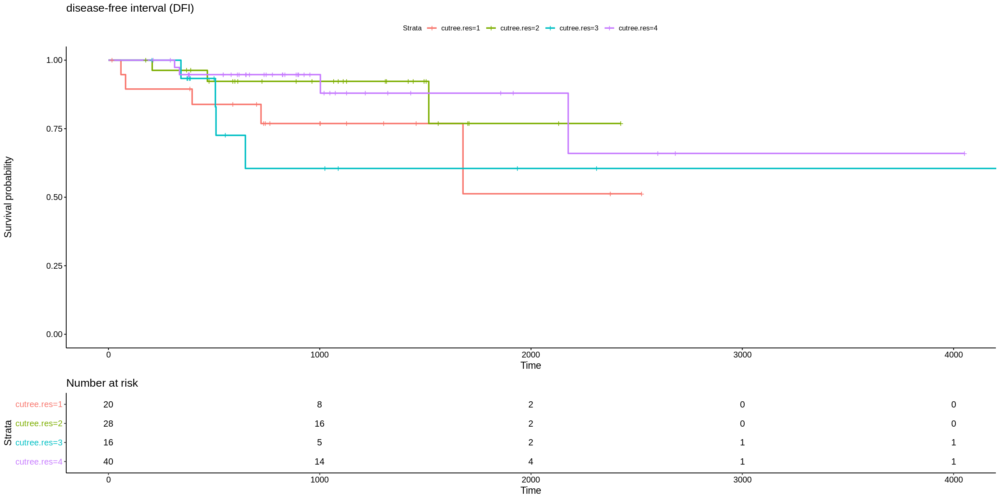

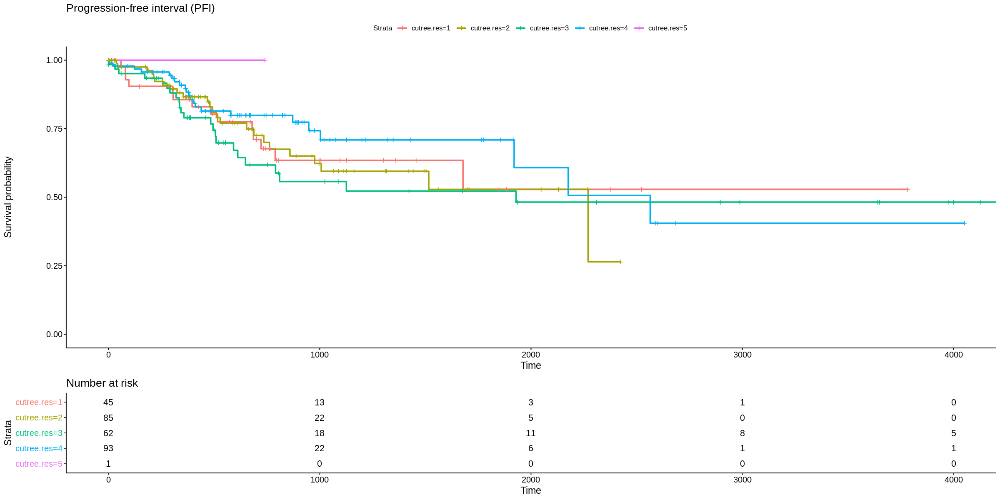

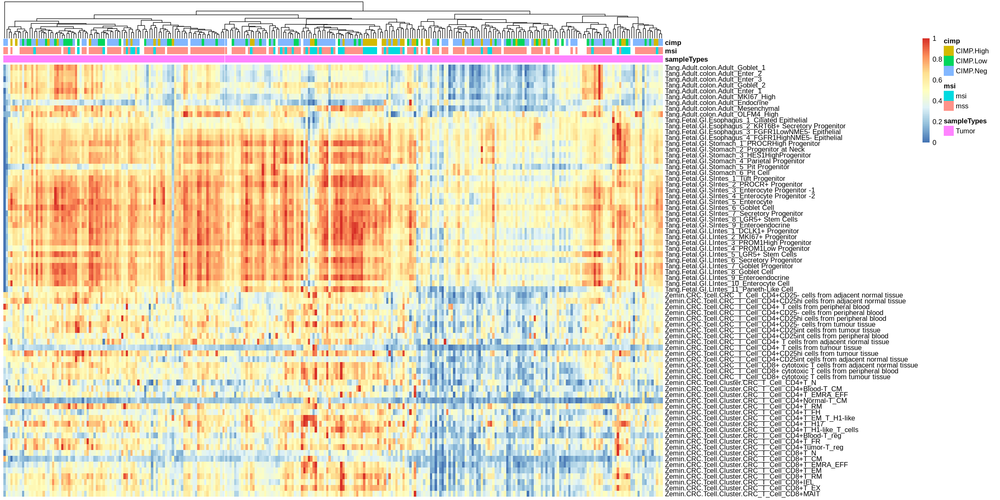

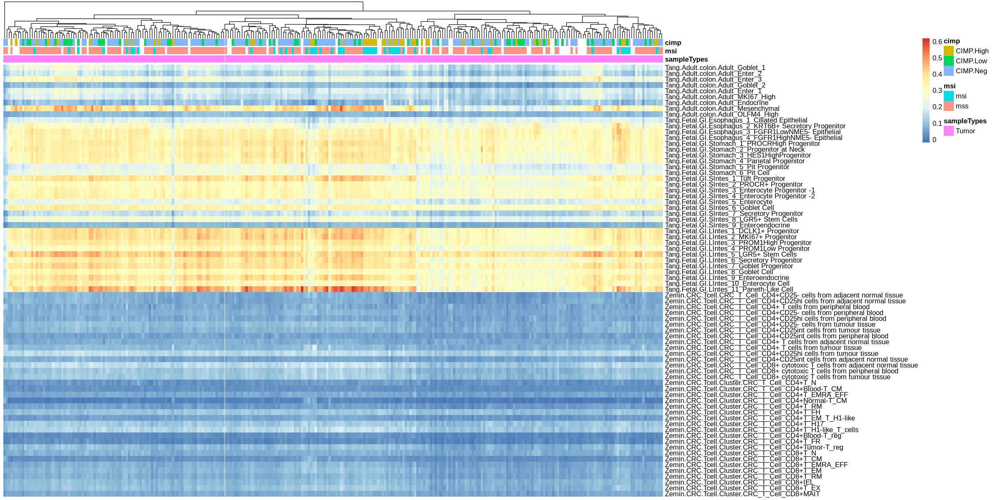

In [13]:
# 3000
### Step1.Figure out the most appropriate dissimilarity measure 
hclust.Res <- hclust(dist(t(Trans.Rang1.cv3000_colon_InNormal), method="euclidean"), method="complete")
## Not good for dist(): "maximum","canberra","binary"
## Good for dist():"euclidean"="minkowski">"manhattan"
options(repr.plot.width=20, repr.plot.height=10)
source("/data8t_4/JH/MyJobs/1_R_script/TCGA_plot/TCGAClusterSurv.R")
TCGAClusterSurv(Input.tb = Trans.Rang1.cv3000_colon_InNormal, hclust.res = hclust.Res, Col.anno = COAD.pheno[TumorID,], k = 5)

Cluster.Res <- pheatmap::pheatmap(Trans.Rang1.cv3000,annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")
Cluster.Res <- pheatmap::pheatmap(Cor.Res.CV3000$Cor.merged[,TumorID],annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")

Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: GenomicRanges
Loading required package: stats4
Loading required package: BiocGenerics

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colMeans,
    colnames, colSums, dirname, do.call, duplicated, eval, evalq,
    Filter, Find, get, grep, grepl, intersect, is.unsorted, lapply,
    lengths, Map, mapply, match, mget, order, paste, pmax, pmax.int,
    pmin, pmin.int, Position, rank, rbind, Reduce, rowMeans, rownames,
    rowSums, sapply, setdiff, sort, tab

Calculating consensus matrix...


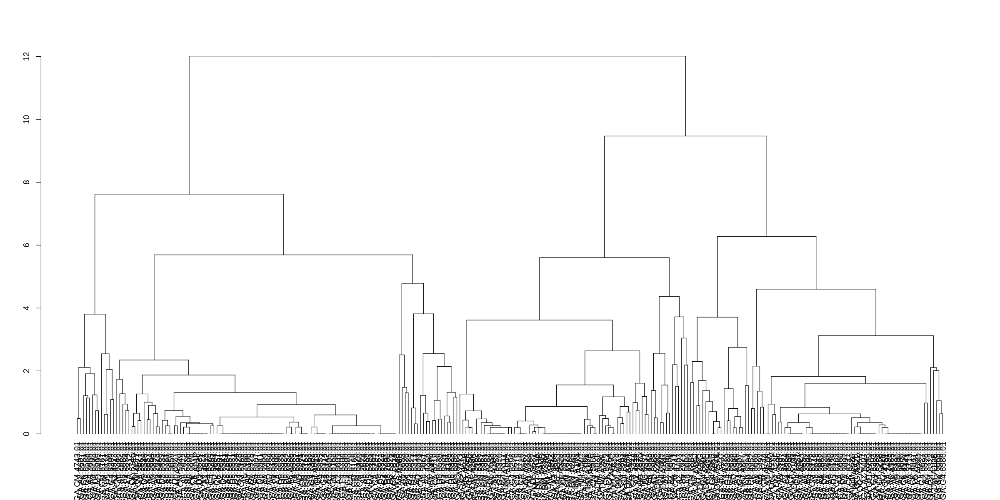

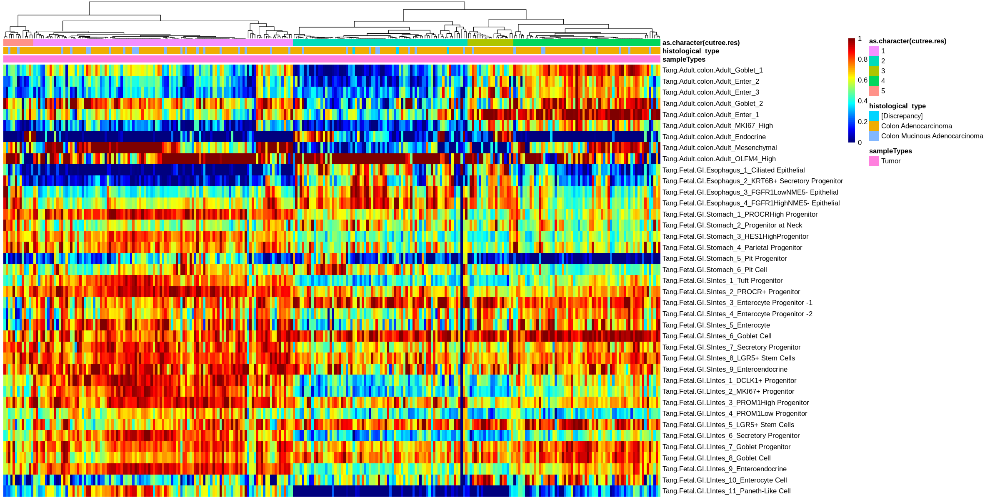

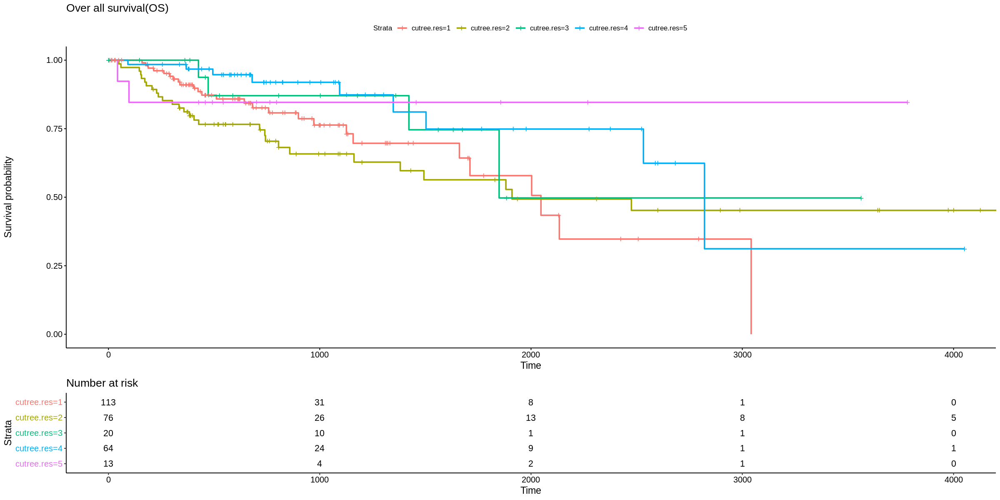

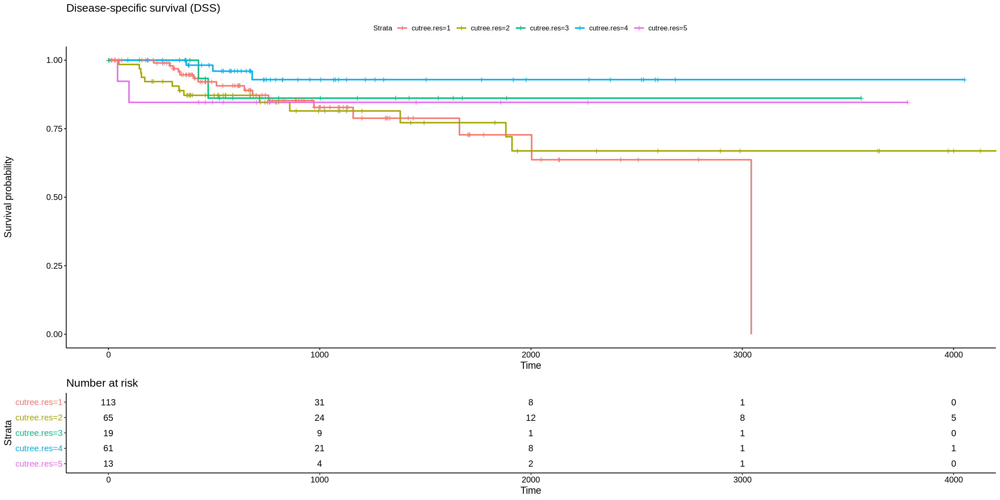

[[1]]

[[2]]

[[3]]

[[4]]

attr(,"class")
[1] "list"            "ggsurvplot_list"

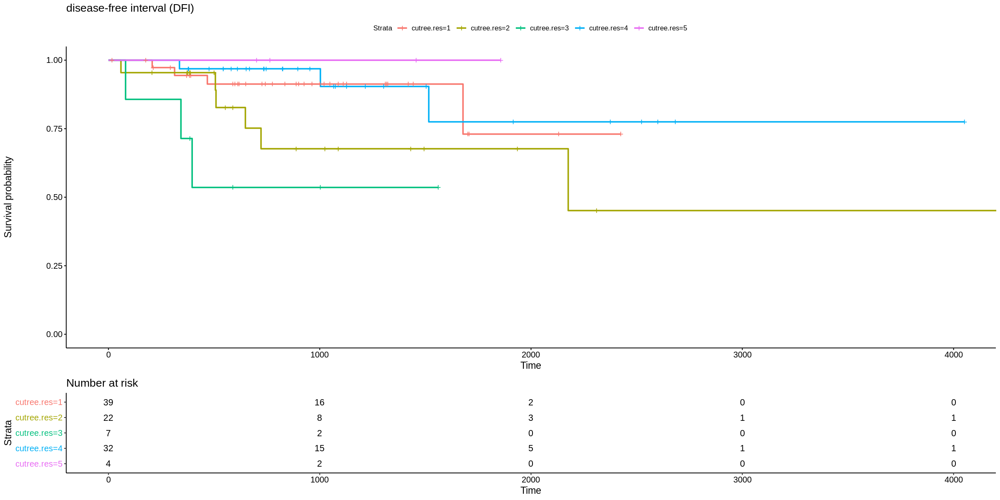

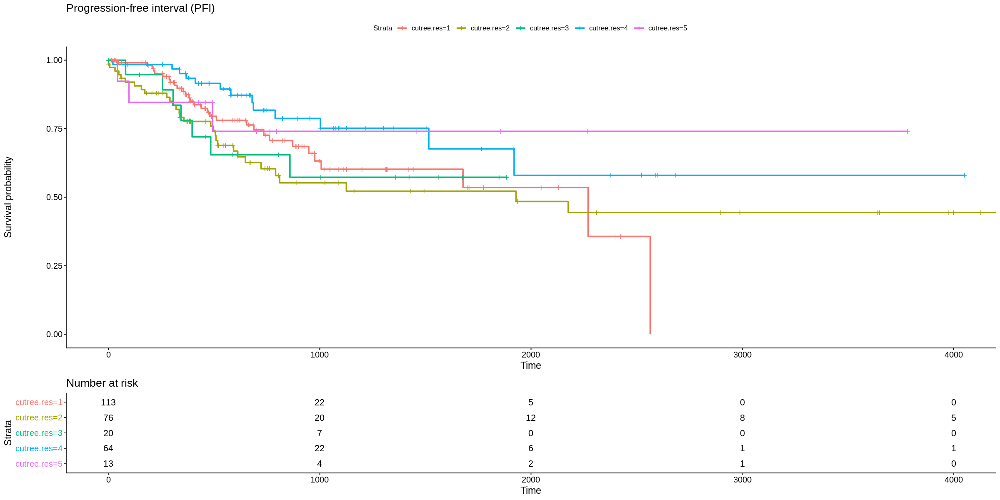

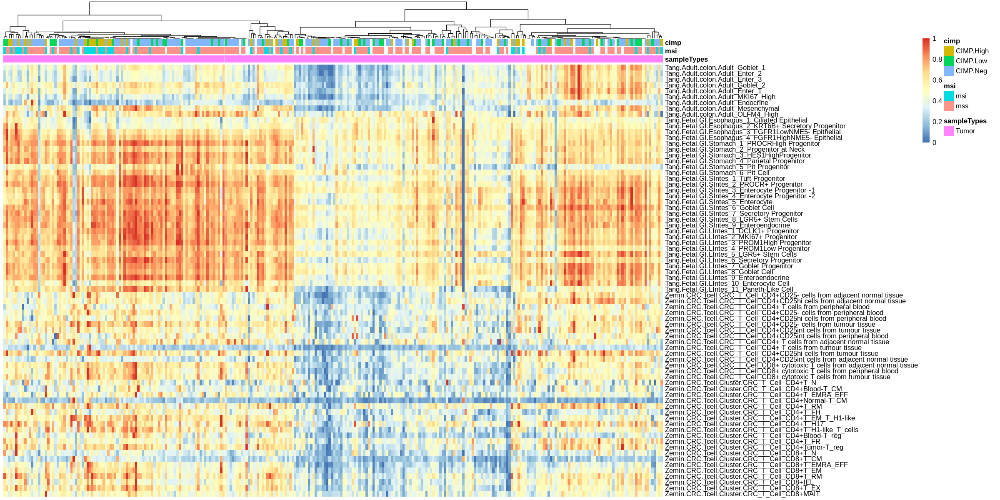

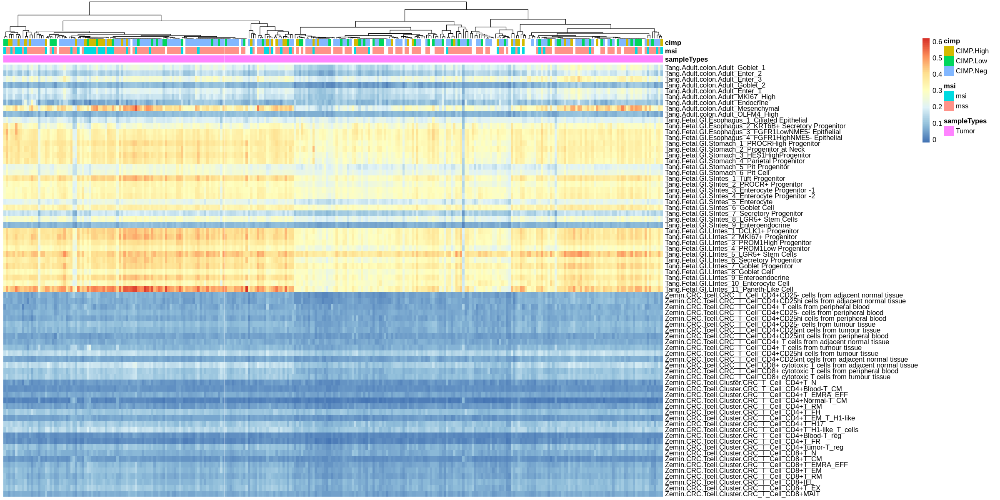

In [14]:
# 3000
### Step1.Figure out the most appropriate dissimilarity measure 
#hclust.Res <- hclust(dist(t(Trans.Rang1.cv3000_colon_InNormal), method="euclidean"), method="complete")
source("/data8t_4/JH/MyJobs/1_R_script/NormalCancer/JH_SC3_cluster.R")
SC3.Tumor <- JH_SC3_cluster(Trans.Rang1.cv3000_colon_InNormal,COAD.pheno[TumorID,],ks=2:4)
## Select a cluster results
hclust.Res <- SC3.Tumor$`3`$hc
## Not good for dist(): "maximum","canberra","binary"
## Good for dist():"euclidean"="minkowski">"manhattan"
options(repr.plot.width=20, repr.plot.height=10)
source("/data8t_4/JH/MyJobs/1_R_script/TCGA_plot/TCGAClusterSurv.R")
TCGAClusterSurv(Input.tb = Trans.Rang1.cv3000_colon_InNormal, hclust.res = hclust.Res, Col.anno = COAD.pheno[TumorID,], k = 5)

Cluster.Res <- pheatmap::pheatmap(Trans.Rang1.cv3000,annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")
Cluster.Res <- pheatmap::pheatmap(Cor.Res.CV3000$Cor.merged[,TumorID],annotation_col = COAD.pheno.tumor,
                                  cluster_cols = hclust.Res,
                                  show_colnames = F,cluster_rows = F,scale = "none")